## 12. Spatial optimization: the facility location problem

### Do cities need drones?

According to a [report](https://www.faa.gov/data_research/aviation/aerospace_forecasts/media/Unmanned_Aircraft_Systems.pdf) by the United States Federal Aviation Agency, 4.47 million small drones are expected to operate in the United States by 2021, up from today's 2.75 million. Since 2017, more than 1 million drone owners have already registered with the Federal Aviation Administration (FAA). So far, [as expected](https://link.springer.com/article/10.1007/s10846-017-0483-z), the main driving force behind this rapid increase in commercial drone purchases is their high mobility and applications in computer vision: taking pictures in dangerous areas, building inspection, traffic monitoring, photogammetry, etc. 

However, **this is just the beginning**. Drones are expected to carry out important tasks in future cities: They will provide a bird's eye view from the sky reporting in no time if a bridge is about to collapse, a fire is spreading or a human being is in trouble. They will [supplement our transport systems](https://www.nesta.org.uk/report/flying-high-challenge-future-of-drone-technology-in-uk-cities/exploring-urban-drone-integration/) by moving things around or getting someone somewhere quickly. In fact, [Amazon's Prime Air](https://en.wikipedia.org/wiki/Amazon_Prime_Air) drone delivery service is already in its final development stage before beginning operations. Drones will also be robots on wings, performing such tasks as repairing bridges or fighting fires.

In this post, we will discuss how drones will affect cities, and how urban planners will have to extend their scope of expertise to be able to deal with urban airspace, urban air traffic, and its interplay with traditional urban space. We will do this by solving the problem of the efficient placement of drone stations in a city and seeing how different urban air traffic configurations lead to different operation zones and urban mobility. 

### Why should urban planners be concerned?

So far, most of us have seen drones only occasionally. But what will happen when swarms of drones flood our cities? **We can confidently expect the deployment of drones at scale to pose some significant challenges to planning, managing, and designing sustainable cities**. 
The proliferation of drone technology at scale would have an impact on the very nature of our cities. Certain types of drone applications will require new physical infrastructure. 

Drone systems could affect the way buildings are designed and built. For instance, if **drone docking stations** will be placed on building roofs, the rooftop will have to be easily accessible for humans, but also for transporting goods to and from it. New buildings would have to be designed to accommodate this (for example, with additional internal or external elevator shafts). It could also be a serious challenge retrofitting old buildings to the new conditions. The visual impact on the built environment would also need to be addressed.

New types infrastructure such as **passenger and logistic hubs** forming a drone mobility network, as well as ground-based **counter drone systems** equipped with **radars, [signal jammers](https://uavcoach.com/drone-jammer/) and [drone capturing technology](https://fortemtech.com/products/dronehunter/)** for combatting drones with rogue or dangerous behaviour will emerge. No-fly zones over critical infrastructure and buildings such as government buildings, airports or prisons will have to be designated and enforced via [geo-fencing](https://en.wikipedia.org/wiki/Geo-fence). Integrating all of this with the existing built environment and creating the necessary regulatory framework for it to function will have a great impact on the daily practice of architects, urban planners and policy makers.

Highly automated drone operations will require fixed docking stations for take off and landing, integrated with charging or refuelling systems. This could be a mobile or permanent station placed on the top of buildings, at street level, [integrated into existing transport infrastructure](https://www.nesta.org.uk/report/flying-high-challenge-future-of-drone-technology-in-uk-cities/exploring-urban-drone-integration/) or other types of infrastructure such as lampposts for smaller stations. These docking stations will most likely be integrated with electric battery charging. Given the energy policies of most developed countries, the impact of the soaring electricity demand on the grid and associated emissions will have to to be considered and carefully planned for.

For instance, the cost of privately owning drones can be [considerably more expensive compared to renting them](https://ieeexplore.ieee.org/document/8288882), especially for companies who may only require drones for a single task. However, with a city-wide rental system in place, the city, companies, and users will not be required to purchase drones, effectively distributing the cost amongst them. 
Therefore, planning a drone rental service based on a system of drone ports (or stations) distributed across the city is necessary. By providing a public drone rental service of distributed autonomous drones waiting at drone stations, this can reduce the total number of drones in the sky and the total cost of utilizing drones to complete tasks requested by the city services, citizens, and other users.
This implies the necessity of addressing the following questions among many others: 
* **Where to place the docking stations?**
* **How many of them?**
* **With what capacity?**

### The facility location problem

The above questions can be answered with the help of mathematical optimization, particularly with [linear programming](https://en.wikipedia.org/wiki/Linear_programming) if formulated as a [capacitated facility location problem](https://en.wikipedia.org/wiki/Facility_location_problem#Capacitated_facility_location).

The latter is a classical optimization problem for choosing the sites for factories, warehouses, power stations, or other infrastructure. A typical facility location problem deals with determining the best among potentially available sites, subject to specific constraints requiring that demands at several locations be serviced by the opened facilities. The costs associated to such an initiative include a part which is usually proportional to the sum of distances from the facilities to the demand locations, as well as to the costs of opening and maintaining the facilities. 
**The objective of the problem is to select facility sites in order to minimize total costs**. The facilities may or may not have limited capacities for servicing, which classifies the problems into capacited and uncapacited variants. 

### Let's give some context!

Imagine a situation in which we are tasked with sketching a concept plan for the placement of drone docking stations in Yerevan city. To solve this problem, we need 

* The potential site locations for placing the docking stations and their fixed cost
* The spatial distribution of drone delivery demand in the city
* The aereal drone flight network for computing travel costs

Let's start by constructing these.

In [1]:
#%install_ext https://raw.github.com/cpcloud/ipython-autotime/master/autotime.py
%load_ext autotime
import osmnx as ox, geopandas as gpd, pandas as pd, networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString, Polygon, MultiPolygon
from IPython.display import Image
from descartes import PolygonPatch
from itertools import combinations, combinations_with_replacement, product
%matplotlib inline
ox.config(log_console=False, use_cache=True)
%config IPCompleter.greedy=True
import contextily as ctx

### Loading the Yerevan street network

Download and project the Yerevan street network using `osmnx`.

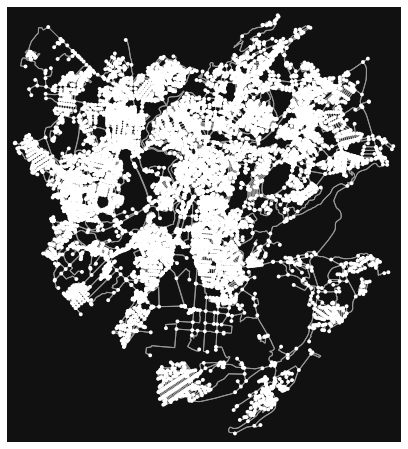

In [2]:
G = ox.graph_from_place('Yerevan, Armenia', network_type='drive')
G = ox.project_graph(G)
fig, ax = ox.plot_graph(G)

In [3]:
print('# edges (streets) in Yerevan: ',len(G.edges))
print('# nodes (crossroads) in Yerevan: ',len(G.nodes))

# edges (streets) in Yerevan:  25325
# nodes (crossroads) in Yerevan:  10301


Let's convert the Yerevan street network to an undirected graph, and take the largest connected component to make sure there are no isolated parts in the network.

In [4]:
G = G.to_undirected()
largest = max(nx.connected_components(G), key=len)
G_largest = G.subgraph(largest)
print('# edges (streets) in Yerevan: ',len(G_largest.edges))
print('# nodes (crossroads) in Yerevan: ',len(G_largest.nodes))

# edges (streets) in Yerevan:  13871
# nodes (crossroads) in Yerevan:  10301


Let's check if the resulting graph is connected:

In [5]:
print(nx.is_connected(G_largest))

True


Let's assume that the aereal drone "street" network will structurally follow the underlying city street network, but will be reduced to the [minimum spanning tree](https://en.wikipedia.org/wiki/Minimum_spanning_tree) of the latter.

In [6]:
G_min = nx.minimum_spanning_tree(G_largest, weight='length')
print('# edges in reduced network: ',len(G_min.edges))
print('# nodes in reduced network: ',len(G_min.nodes))

# edges in reduced network:  10300
# nodes in reduced network:  10301


### Loading Yerevan administrative area

Now, let's load yerevan city from OpenStreetMap using `osmnx` API.

Yerevan coordinate reference system before projection:  epsg:4326
Yerevan coordinate reference system after projection:  +proj=utm +zone=38 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs


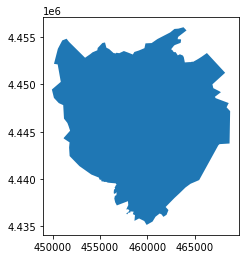

In [7]:
city = ox.geocode_to_gdf("Yerevan, Armenia")
print("Yerevan coordinate reference system before projection: ", city.crs)
city = ox.projection.project_gdf(city)
ax = city.plot(ec='none')
#_ = ax.axis('off')
print("Yerevan coordinate reference system after projection: ", city.crs)

Now, let's plot some isochrones to visualise our new network:

In [8]:
# configure trip times and travel speed

trip_times = [5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60]  # in minutes
travel_speed = 4.5  # walking speed in km/hour

In [9]:
# get the coordinates of the center (Republic square) and find the nearest node in the network

# Republic square coordinates: 40.1777° N, 44.5127° E
C = Point(44.5127, 40.1777)

from pyproj import CRS
crs = CRS.from_epsg(4326)
print(crs)

# create GeoDataFrame from the center point
gdf_cen = gpd.GeoDataFrame({"geometry" : [C]}, crs = crs)
gdf_cen = gdf_cen.to_crs(city.crs)
print(gdf_cen.crs)

x, y = gdf_cen.loc[0, "geometry"].xy
center_node = ox.distance.nearest_nodes(G_min, x[0], y[0])
print("Center node ID: ", center_node)

epsg:4326
+proj=utm +zone=38 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs
Center node ID:  354684572


In [10]:
# add an edge attribute for time in minutes required to cross each edge at the 
# specified travel speed
meters_per_minute = travel_speed * 1000 / 60  # km per hour to m per minute
for _, _, _, data in G_min.edges(data=True, keys=True):
    data["time"] = data["length"] / meters_per_minute

In [11]:
# get one color for each isochrone
iso_colors = ox.plot.get_colors(n=len(trip_times), cmap="viridis", start=0, return_hex=True)
print(iso_colors)

['#440154', '#482173', '#433e85', '#38588c', '#2d708e', '#25858e', '#1e9b8a', '#2ab07f', '#52c569', '#86d549', '#c2df23', '#fde725']


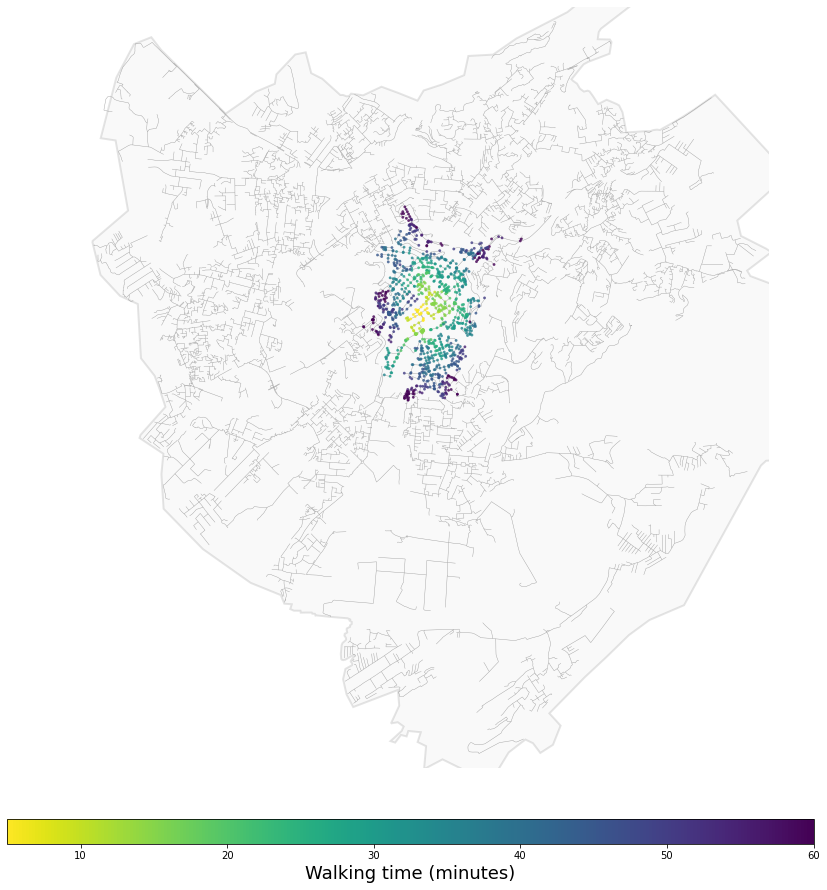

In [12]:
node_colors = {}

cmap = plt.cm.get_cmap('viridis_r')
norm=plt.Normalize(vmin=min(trip_times), vmax=max(trip_times))
sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])

for trip_time, color in zip(sorted(trip_times, reverse=True), iso_colors):
    subgraph = nx.ego_graph(G_min, center_node, radius=trip_time, distance="time")
    for node in subgraph.nodes():
        node_colors[node] = color
nc = [node_colors[node] if node in node_colors else "none" for node in G_min.nodes()]
ns = [8 if node in node_colors else 0 for node in G_min.nodes()]
fig, ax = ox.plot_graph(
    G_min,
    figsize=(16, 14),
    node_color=nc,
    node_size=ns,
    node_alpha=0.8,
    edge_linewidth=0.4,
    bgcolor="w",
    edge_color="#999999",
    show=False,
    close=False
)
plt.close()
# to this matplotlib axis, add the place shape as descartes polygon patches
for geometry in city['geometry'].tolist():
    if isinstance(geometry, (Polygon, MultiPolygon)):
        if isinstance(geometry, Polygon):
            geometry = MultiPolygon([geometry])
        for polygon in geometry:
            patch = PolygonPatch(polygon, fc='#cccccc', ec='k', linewidth=2, alpha=0.1, zorder=-1)
            ax.add_patch(patch)
            
cbax = fig.add_axes([0.15, 0.05, 0.7, 0.025])
cb = fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax, cax=cbax, orientation="horizontal")
cb.set_label('Walking time (minutes)', fontsize = 18)
fig

Now, let's subdivide the Yerevan administrative area into quadratic grid cells of size 300 x 300 meters:

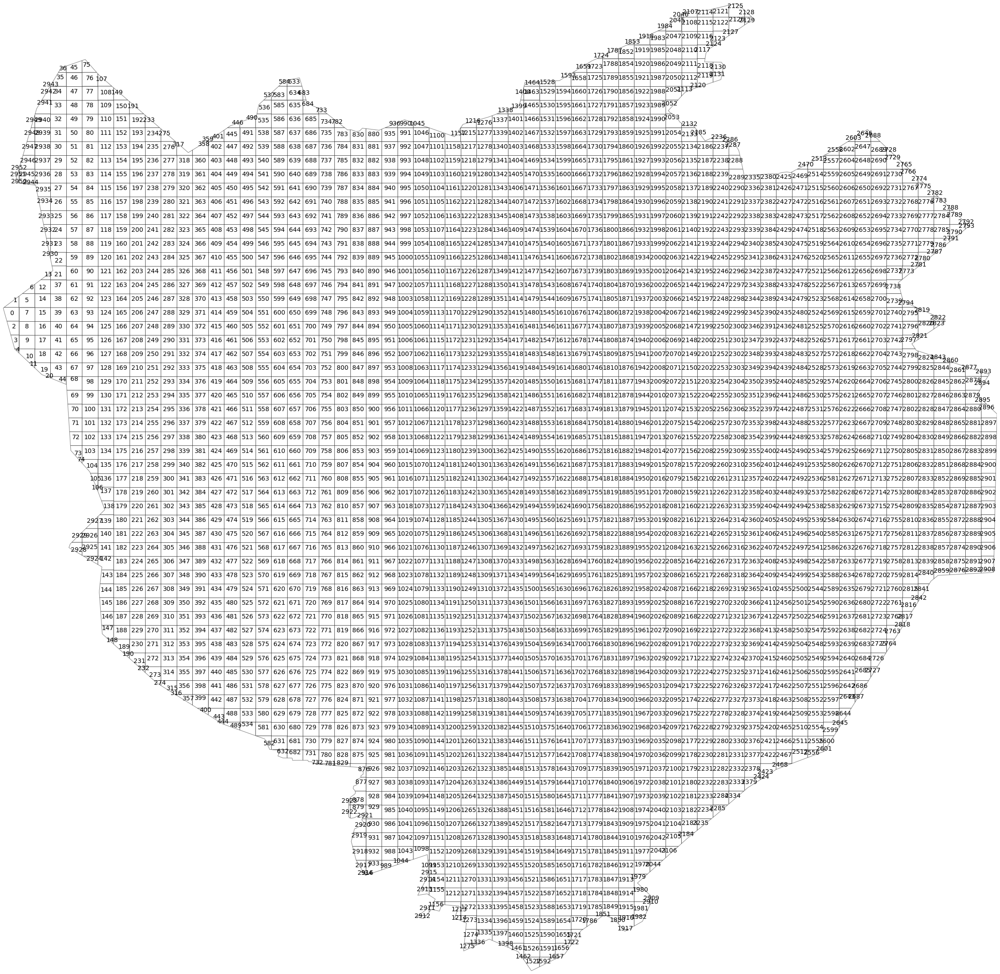

In [13]:
# make the geometry a multipolygon if it's not already
geometry = city['geometry'].iloc[0]
if isinstance(geometry, Polygon):
    geometry = MultiPolygon([geometry])
    
# quadrat_width is in the units the geometry is in, so we'll do a tenth of a degree
geometry_cut = ox.utils_geo._quadrat_cut_geometry(geometry, quadrat_width=300)

city['coords'] = city['geometry'].apply(lambda x: x.representative_point().coords[:])
city['coords'] = [coords[0] for coords in city['coords']]

polylist = [p for p in geometry_cut]

west, south, east, north = city.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,40))
for polygon, n in zip(geometry_cut, np.arange(len(polylist))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5, zorder=2)
    ax.add_patch(patch)
    plt.annotate(text=n, xy=p,
                 horizontalalignment='center', size=14)
    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [14]:
polyframe = gpd.GeoDataFrame(geometry=polylist)
polyframe.crs = city.geometry.crs
polyframe.tail()

,geometry
2948,"POLYGON ((450363.968 4453047.932, 450440.765 4..."
2949,"POLYGON ((450440.765 4453346.173, 450510.503 4..."
2950,"POLYGON ((450211.630 4452152.582, 450207.478 4..."
2951,"POLYGON ((450207.478 4452153.209, 450136.344 4..."
2952,"POLYGON ((450210.374 4452451.450, 450211.630 4..."


Now, let's get the grid cell centroids and the cell areas and store them as column features in our GeoDataFrame:

In [15]:
polyframe['center_lon'] = polyframe['geometry'].apply(lambda x: x.centroid.coords[0][0])
polyframe['center_lat'] = polyframe['geometry'].apply(lambda x: x.centroid.coords[0][1])
polyframe['area'] = polyframe['geometry'].apply(lambda x: x.area)
polyframe.tail()

,geometry,center_lon,center_lat,area
2948,"POLYGON ((450363.968 4453047.932, 450440.765 4...",450454.162393,4.453179e+06,32250.654963
2949,"POLYGON ((450440.765 4453346.173, 450510.503 4...",450487.257129,4.453436e+06,9443.380236
2950,"POLYGON ((450211.630 4452152.582, 450207.478 4...",450210.245984,4.452153e+06,1.302202
2951,"POLYGON ((450207.478 4452153.209, 450136.344 4...",450186.525450,4.452258e+06,11429.447964
2952,"POLYGON ((450210.374 4452451.450, 450211.630 4...",450211.211309,4.452453e+06,3.062494


Looking at the area column, we notice areas that are much smaller than the expected $300 \times 300 = 90,000 \ m^2$ (can you guess why?). So let's get rid of them to keep the subdivision clear and consistent:

In [16]:
print(len(polyframe))
polyframe = polyframe[polyframe.area>85000]
print(len(polyframe))

2953
2660


In [17]:
polyframe.reset_index(inplace=True, drop=True)
polyframe.tail()

,geometry,center_lon,center_lat,area
2655,"POLYGON ((450510.503 4452451.450, 450510.503 4...",450659.939565,4.452601e+06,89136.212128
2656,"POLYGON ((450510.503 4452749.691, 450510.503 4...",450659.939565,4.452899e+06,89136.212128
2657,"POLYGON ((450510.503 4453047.932, 450510.503 4...",450659.939565,4.453197e+06,89136.212128
2658,"POLYGON ((450510.503 4453346.173, 450510.503 4...",450660.099414,4.453495e+06,89039.444360
2659,"POLYGON ((450211.630 4452153.209, 450211.630 4...",450361.066474,4.452302e+06,89136.212128


Let's plot the result on a map:

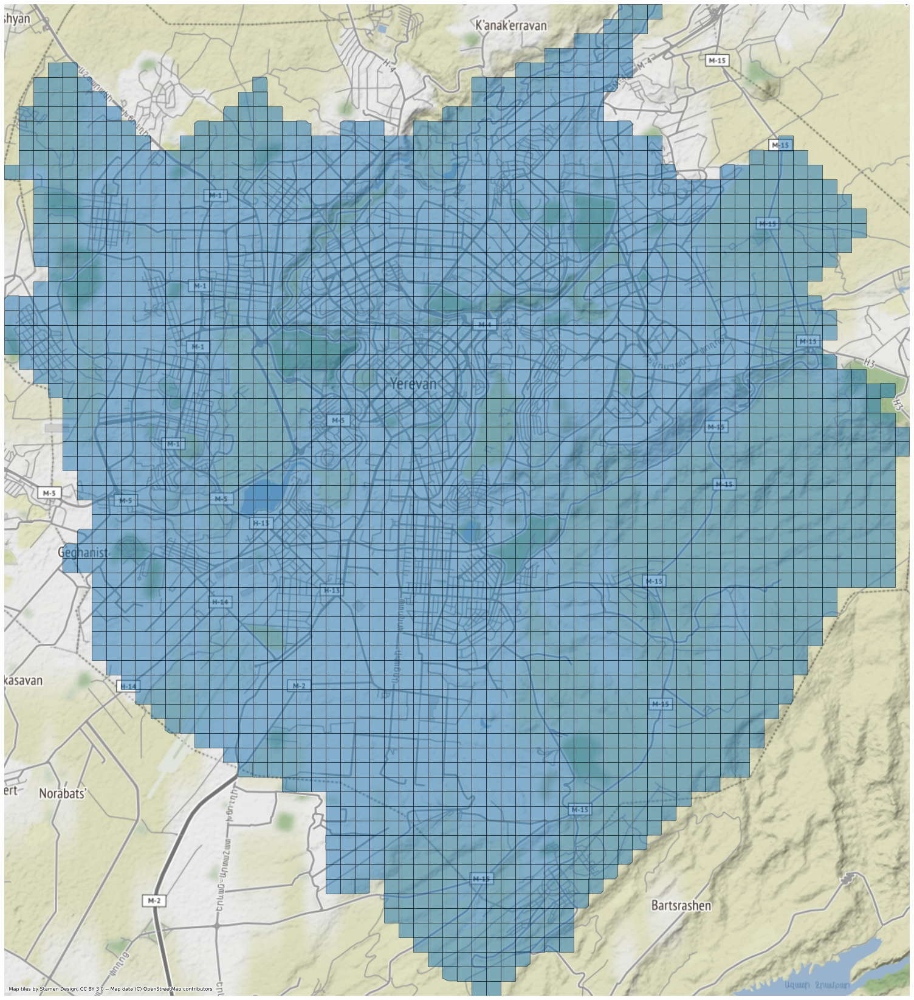

In [18]:
import contextily as ctx

west, south, east, north = polyframe.unary_union.bounds
ax = polyframe.plot(figsize=(30, 30), alpha=0.5, edgecolor='k')
ctx.add_basemap(ax, crs=city.crs, zoom=13)
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
plt.show()

In [19]:
polyframe.to_file("../data/Yerevan_grid_cells_opt.geojson", driver='GeoJSON')

### Building the demand matrix

In [20]:
# import Yerevan taxi vehicle gps data set
data = pd.read_csv('../data/Yerevan_gps_data.csv', \
                   header=0, index_col=0, nrows=9*10**6)
print(len(data))
data.tail()

C:\Users\gevor\anaconda3\lib\site-packages\numpy\lib\arraysetops.py:580: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


9000000


,createdAt,partnerId,lat,lon,status
8999995,2019-03-31 13:48:29,152213,40.182825,44.571313,0
8999996,2019-03-31 13:48:45,152213,40.182800,44.571316,0
8999997,2019-03-31 13:49:01,152213,40.182810,44.571336,0
8999998,2019-03-31 13:49:17,152213,40.182824,44.571320,0
8999999,2019-03-31 13:49:29,152213,40.182825,44.571318,0


Let's make sure our data points are within the Yerevan administrative area.

In [21]:
polyframe_crs = polyframe.to_crs(crs)
w, s, e, n = polyframe_crs.unary_union.bounds
data = data.loc[(data.lon <= e) & \
                (data.lat <= n) & (data.lon >= w) & (data.lat >= s)]

data.reset_index(inplace=True, drop=True)
print(len(data))
data.tail()

8905755


,createdAt,partnerId,lat,lon,status
8905750,2019-03-31 13:48:29,152213,40.182825,44.571313,0
8905751,2019-03-31 13:48:45,152213,40.182800,44.571316,0
8905752,2019-03-31 13:49:01,152213,40.182810,44.571336,0
8905753,2019-03-31 13:49:17,152213,40.182824,44.571320,0
8905754,2019-03-31 13:49:29,152213,40.182825,44.571318,0


In [22]:
geometry = [Point(xy) for xy in zip(data.lon, data.lat)] #list comprehension
gdf = gpd.GeoDataFrame(data, crs=crs, geometry=geometry)
gdf.head()

,createdAt,partnerId,lat,lon,status,geometry
0,2019-03-31 15:11:10,2,40.177266,44.445987,0,POINT (44.44599 40.17727)
1,2019-03-15 16:29:56,12,40.199932,44.496100,0,POINT (44.49610 40.19993)
2,2019-03-15 16:30:27,12,40.199932,44.496100,0,POINT (44.49610 40.19993)
3,2019-03-18 20:17:29,12,40.175073,44.572091,0,POINT (44.57209 40.17507)
4,2019-03-18 20:17:45,12,40.175047,44.572103,0,POINT (44.57210 40.17505)


In [23]:
#reproject geometry to yerevan grid crs
gdf.geometry = gdf.geometry.to_crs(city.geometry.crs)
gdf.head()

,createdAt,partnerId,lat,lon,status,geometry
0,2019-03-31 15:11:10,2,40.177266,44.445987,0,POINT (452832.035 4447579.433)
1,2019-03-15 16:29:56,12,40.199932,44.496100,0,POINT (457112.862 4450069.794)
2,2019-03-15 16:30:27,12,40.199932,44.496100,0,POINT (457112.862 4450069.794)
3,2019-03-18 20:17:29,12,40.175073,44.572091,0,POINT (463567.204 4447276.695)
4,2019-03-18 20:17:45,12,40.175047,44.572103,0,POINT (463568.220 4447273.748)


In [24]:
print(gdf.crs)

+proj=utm +zone=38 +ellps=WGS84 +datum=WGS84 +units=m +no_defs +type=crs


In [25]:
# do a spatial join operation to identify which points fall into which grid cell
pointInPoly = gpd.sjoin(polyframe, gdf, op='contains')
print(len(pointInPoly))
pointInPoly.tail()

8761091


,geometry,center_lon,center_lat,area,index_right,createdAt,partnerId,lat,lon,status
2653,"POLYGON ((451407.122 4444398.943, 451407.122 4...",451560.676524,4.444544e+06,86311.628471,3001457,2019-03-18 13:35:10,50514,40.149083,44.431016,0
2653,"POLYGON ((451407.122 4444398.943, 451407.122 4...",451560.676524,4.444544e+06,86311.628471,3001464,2019-03-18 13:36:54,50514,40.149085,44.430989,0
2653,"POLYGON ((451407.122 4444398.943, 451407.122 4...",451560.676524,4.444544e+06,86311.628471,3001450,2019-03-18 13:33:26,50514,40.149085,44.431068,0
2653,"POLYGON ((451407.122 4444398.943, 451407.122 4...",451560.676524,4.444544e+06,86311.628471,3001449,2019-03-18 13:33:10,50514,40.149087,44.431049,0
2653,"POLYGON ((451407.122 4444398.943, 451407.122 4...",451560.676524,4.444544e+06,86311.628471,3001467,2019-03-18 13:37:42,50514,40.149088,44.431046,0


In [26]:
pointInPoly.sort_values(['partnerId', 'createdAt'], inplace=True)
pointInPoly['index'] = pointInPoly.index
pointInPoly.reset_index(drop=True, inplace=True)
pointInPoly.head()

,geometry,center_lon,center_lat,area,index_right,createdAt,partnerId,lat,lon,status,index
0,"POLYGON ((452901.488 4447679.594, 452901.488 4...",452752.051197,4.447530e+06,89136.212128,0,2019-03-31 15:11:10,2,40.177266,44.445987,0,209
1,"POLYGON ((457384.584 4450363.763, 457384.584 4...",457235.147551,4.450215e+06,89136.212128,1,2019-03-15 16:29:56,12,40.199932,44.496100,0,859
2,"POLYGON ((457384.584 4450363.763, 457384.584 4...",457235.147551,4.450215e+06,89136.212128,2,2019-03-15 16:30:27,12,40.199932,44.496100,0,859
3,"POLYGON ((463660.919 4447381.353, 463660.919 4...",463511.482447,4.447232e+06,89136.212128,3,2019-03-18 20:17:29,12,40.175073,44.572091,0,2089
4,"POLYGON ((463660.919 4447381.353, 463660.919 4...",463511.482447,4.447232e+06,89136.212128,4,2019-03-18 20:17:45,12,40.175047,44.572103,0,2089


In [27]:
present_ind = list(pointInPoly['index_right'])
len(present_ind)

8761091

In [28]:
gdf_test = gdf.copy()

# keep only those points that are within the gridded polygons
gdf_test_dropped = gdf_test.iloc[present_ind,:]
len(gdf_test_dropped)

8761091

In [29]:
gdf_dropped = gdf_test_dropped.copy()
gdf_dropped['present_index'] = gdf_dropped.index
gdf_dropped.reset_index(drop=True, inplace=True)
gdf_dropped.tail()

,createdAt,partnerId,lat,lon,status,geometry,present_index
8761086,2019-03-31 13:48:29,152213,40.182825,44.571313,0,POINT (463505.160 4448137.474),8905750
8761087,2019-03-31 13:48:45,152213,40.182800,44.571316,0,POINT (463505.402 4448134.632),8905751
8761088,2019-03-31 13:49:01,152213,40.182810,44.571336,0,POINT (463507.101 4448135.711),8905752
8761089,2019-03-31 13:49:17,152213,40.182824,44.571320,0,POINT (463505.687 4448137.305),8905753
8761090,2019-03-31 13:49:29,152213,40.182825,44.571318,0,POINT (463505.577 4448137.372),8905754


In [30]:
pointInPoly.tail()

,geometry,center_lon,center_lat,area,index_right,createdAt,partnerId,lat,lon,status,index
8761086,"POLYGON ((463660.919 4448276.076, 463660.919 4...",463511.482447,4.448127e+06,89136.212128,8905750,2019-03-31 13:48:29,152213,40.182825,44.571313,0,2086
8761087,"POLYGON ((463660.919 4448276.076, 463660.919 4...",463511.482447,4.448127e+06,89136.212128,8905751,2019-03-31 13:48:45,152213,40.182800,44.571316,0,2086
8761088,"POLYGON ((463660.919 4448276.076, 463660.919 4...",463511.482447,4.448127e+06,89136.212128,8905752,2019-03-31 13:49:01,152213,40.182810,44.571336,0,2086
8761089,"POLYGON ((463660.919 4448276.076, 463660.919 4...",463511.482447,4.448127e+06,89136.212128,8905753,2019-03-31 13:49:17,152213,40.182824,44.571320,0,2086
8761090,"POLYGON ((463660.919 4448276.076, 463660.919 4...",463511.482447,4.448127e+06,89136.212128,8905754,2019-03-31 13:49:29,152213,40.182825,44.571318,0,2086


In [31]:
# sanity check to make sure polygons containing the GPS points have the correct indices
polyframe.iloc[2086].geometry.contains(gdf_dropped.iloc[8761090][5])

True

In [32]:
# change vehicle status to only 0 (idle) and 1 (occupied)
gdf_dropped.loc[gdf_dropped.status==2,'status'] = 0
gdf_dropped.loc[gdf_dropped.status==3,'status'] = 1
gdf_dropped.status.unique()

array([0, 1], dtype=int64)

In [33]:
# for each vehicle create create a 'trip' attribute counting the number of trips
gdf_dropped['trip'] = gdf_dropped.groupby('partnerId').apply(lambda x: x['status'].ne(x['status'].shift()).cumsum()).tolist()
gdf_dropped.tail()

,createdAt,partnerId,lat,lon,status,geometry,present_index,trip
8761086,2019-03-31 13:48:29,152213,40.182825,44.571313,0,POINT (463505.160 4448137.474),8905750,250
8761087,2019-03-31 13:48:45,152213,40.182800,44.571316,0,POINT (463505.402 4448134.632),8905751,250
8761088,2019-03-31 13:49:01,152213,40.182810,44.571336,0,POINT (463507.101 4448135.711),8905752,250
8761089,2019-03-31 13:49:17,152213,40.182824,44.571320,0,POINT (463505.687 4448137.305),8905753,250
8761090,2019-03-31 13:49:29,152213,40.182825,44.571318,0,POINT (463505.577 4448137.372),8905754,250


In [34]:
gdf_dropped['pindex'] = pointInPoly['index']
#check if there are any missing values
print(gdf_dropped.isna().values.any())
gdf_dropped.tail()

False


,createdAt,partnerId,lat,lon,status,geometry,present_index,trip,pindex
8761086,2019-03-31 13:48:29,152213,40.182825,44.571313,0,POINT (463505.160 4448137.474),8905750,250,2086
8761087,2019-03-31 13:48:45,152213,40.182800,44.571316,0,POINT (463505.402 4448134.632),8905751,250,2086
8761088,2019-03-31 13:49:01,152213,40.182810,44.571336,0,POINT (463507.101 4448135.711),8905752,250,2086
8761089,2019-03-31 13:49:17,152213,40.182824,44.571320,0,POINT (463505.687 4448137.305),8905753,250,2086
8761090,2019-03-31 13:49:29,152213,40.182825,44.571318,0,POINT (463505.577 4448137.372),8905754,250,2086


In [35]:
# check dataframe length
len(gdf_dropped)

8761091

In [36]:
# make a total trip counter for the entire dataset
gdf_dropped['trips'] = gdf_dropped['trip'].ne(gdf_dropped['trip'].shift()).cumsum()
gdf_dropped['trips'] = gdf_dropped['trips']+gdf_dropped['partnerId']
gdf_dropped['trips'] = pd.factorize(gdf_dropped.trips)[0] + 1
gdf_dropped.tail()

,createdAt,partnerId,lat,lon,status,geometry,present_index,trip,pindex,trips
8761086,2019-03-31 13:48:29,152213,40.182825,44.571313,0,POINT (463505.160 4448137.474),8905750,250,2086,151091
8761087,2019-03-31 13:48:45,152213,40.182800,44.571316,0,POINT (463505.402 4448134.632),8905751,250,2086,151091
8761088,2019-03-31 13:49:01,152213,40.182810,44.571336,0,POINT (463507.101 4448135.711),8905752,250,2086,151091
8761089,2019-03-31 13:49:17,152213,40.182824,44.571320,0,POINT (463505.687 4448137.305),8905753,250,2086,151091
8761090,2019-03-31 13:49:29,152213,40.182825,44.571318,0,POINT (463505.577 4448137.372),8905754,250,2086,151091


In [37]:
gdf_c = gdf_dropped.copy()
gdf_c.drop(['present_index', 'status', 'trip', 'geometry'], axis=1, inplace=True)
gdf_c.tail()

,createdAt,partnerId,lat,lon,pindex,trips
8761086,2019-03-31 13:48:29,152213,40.182825,44.571313,2086,151091
8761087,2019-03-31 13:48:45,152213,40.182800,44.571316,2086,151091
8761088,2019-03-31 13:49:01,152213,40.182810,44.571336,2086,151091
8761089,2019-03-31 13:49:17,152213,40.182824,44.571320,2086,151091
8761090,2019-03-31 13:49:29,152213,40.182825,44.571318,2086,151091


Since we had loaded a random number of 9 million points, the last point of the last trip in that sample might not represent the actual destination point of that last trip, so we should ideally get rid of it.

In [38]:
gdf_c = gdf_c[gdf_c.trips!=151091]
gdf_c.tail()

,createdAt,partnerId,lat,lon,pindex,trips
8760299,2019-03-30 20:18:44,152213,40.201270,44.567113,2030,151090
8760300,2019-03-30 20:19:00,152213,40.201313,44.566795,2030,151090
8760301,2019-03-30 20:19:16,152213,40.201862,44.566515,2030,151090
8760302,2019-03-30 20:19:32,152213,40.201984,44.566301,2030,151090
8760303,2019-03-30 20:19:48,152213,40.202006,44.565959,1980,151090


In [39]:
gdf_c.to_csv('../data/Yerevan_drone_proj_trips.csv')

In [40]:
np.unique(gdf_c.trips)

array([     1,      2,      3, ..., 151088, 151089, 151090], dtype=int64)

Let's finally construct the demand matrix!

In [41]:
import multiprocessing 
import od_count_function
from tqdm import tqdm

# 151090 = 2 × 5 × 29 × 521

n = len(polyframe)
mat = np.zeros(shape=(n, n), dtype=np.uint16)
    
# def func(gdf_c):
#     mat2 = np.zeros(shape=(1488, 1488), dtype=np.uint16)
#     for trip in gdf_c['trips'].unique():
#         df = gdf_c[gdf_c['trips']==trip]
#         mat2[df.pindex.iloc[0], df.pindex.iloc[-1]] += (df.ts.iloc[-1] - df.ts.iloc[0]).total_seconds()
#     return mat2
                
    
results = []
pool = multiprocessing.Pool(processes=8)

i = 0
unique = gdf_c['trips'].unique()
trip_per_async = 290
for t in tqdm(range(0, len(unique), trip_per_async)):
    hi = unique[t+trip_per_async-1]
    lo = unique[t]
    df = gdf_c[(gdf_c['trips'] >= lo) & (gdf_c['trips'] <= hi)]
    results.append(pool.apply_async(od_count_function.func, (df,)))
    i += 1
    if i % 50:
        for r in results:
            mat2 = r.get()
            mat += mat2
        results = []

pool.close()
pool.join()   
print('done')
    
od1 = mat.astype(int)
print(od1)
np.savetxt("../data/Yerevan_OD_drone_proj.csv", od1, fmt="%g", delimiter=",")

100%|██████████████████████████████████████████████████████████████████████████████| 521/521 [03:39<00:00,  2.38it/s]


done
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


Let's check the sum of the entries of the resulting matrix:

In [42]:
od1.sum()

151090

Let's get destination sums for each grid cell, and add these values as total demand in a new column to our dataframe:

In [43]:
colsums = od1.sum(axis=0)
polyflows = polyframe.copy()
polyflows['inflow'] = colsums
polyflows.head()

,geometry,center_lon,center_lat,area,inflow
0,"POLYGON ((450211.630 4449710.483, 450277.957 4...",450363.815252,4.449615e+06,87252.580656,1
1,"POLYGON ((450510.503 4449469.040, 450510.503 4...",450361.066474,4.449320e+06,89136.212128,0
2,"POLYGON ((450510.503 4449170.799, 450510.503 4...",450361.066474,4.449022e+06,89136.212128,0
3,"POLYGON ((450510.503 4448872.558, 450510.503 4...",450361.066474,4.448723e+06,89136.212128,1
4,"POLYGON ((450809.376 4449767.281, 450809.376 4...",450659.939565,4.449618e+06,89136.212128,0


C:\Users\gevor\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='inflow', ylabel='Density'>

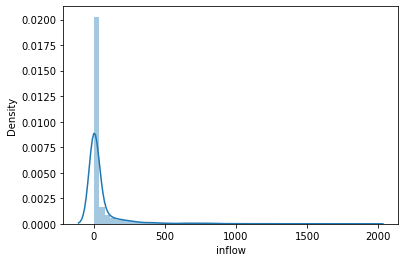

In [47]:
# plot a quick ditribution of inflow values:
import seaborn as sbn
sbn.distplot(polyflows['inflow'])

In [48]:
demand = np.array(polyflows.inflow)
np.save('../data/drone_demand.npy', demand)

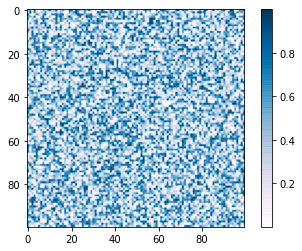

In [49]:
import matplotlib.colors as colors
from matplotlib.colors import LinearSegmentedColormap

def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

# get colormap
ncolors = 256
color_array = plt.get_cmap('PuBu')(range(ncolors))

# change alpha values
color_array[:,-1] = np.linspace(0.35,1,ncolors)

# create a colormap object
map_object = LinearSegmentedColormap.from_list(name='PuBu_transp',colors=color_array)

# register this new colormap with matplotlib
plt.register_cmap(cmap=map_object)

# show some example data
f,ax = plt.subplots()
h = ax.imshow(np.random.rand(100,100),cmap='PuBu_transp')
plt.colorbar(mappable=h)

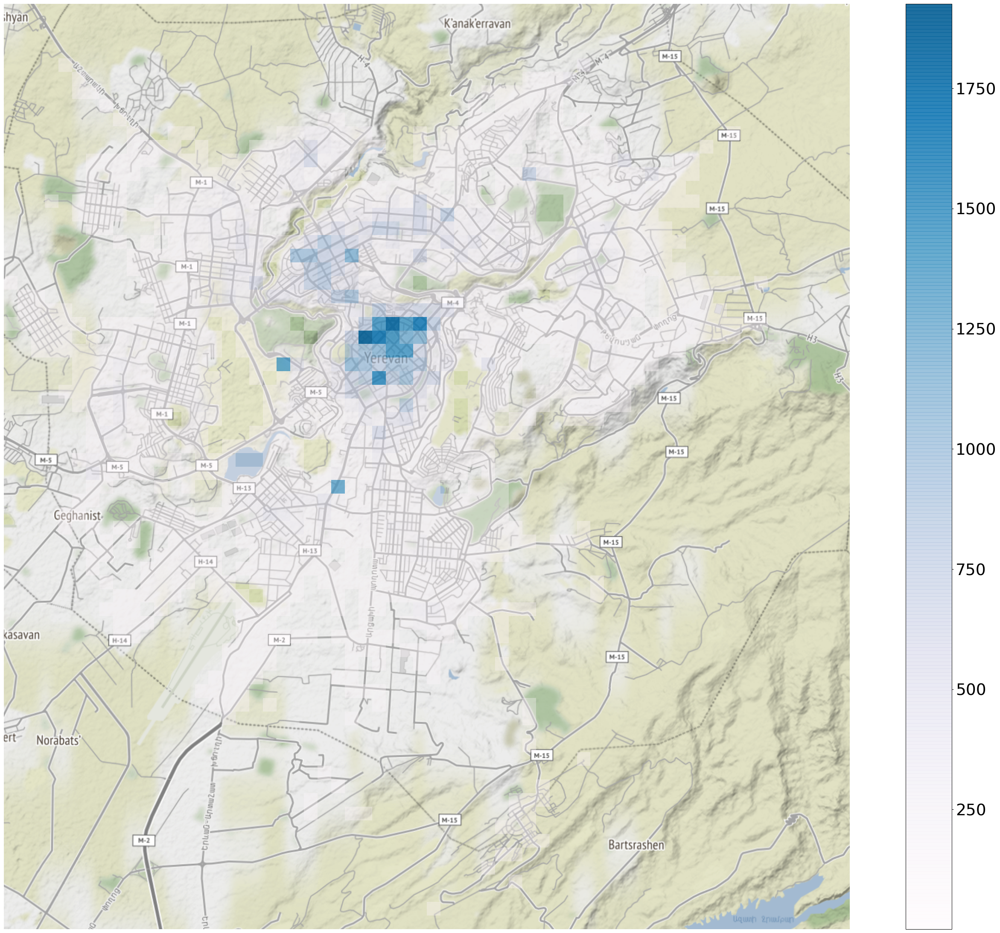

In [50]:
#import contextily as ctx
plt.rcParams.update({'font.size':30})
cmap = plt.get_cmap('PuBu_transp')
new_cmap = truncate_colormap(cmap, 0, 0.85)
west, south, east, north = polyflows.unary_union.bounds

fig, ax = plt.subplots(figsize=(30,25), dpi=90)

polyflows[polyflows.inflow>0].plot(column='inflow', cmap=new_cmap, ax=ax, legend=True) 

ctx.add_basemap(ax, crs = polyflows.crs, attribution="", zoom=13, alpha=0.9)
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
#plt.title('Yerevan demand',fontsize= 30, color='grey')
# fig.savefig('Yerevan_demand.jpg', dpi=fig.dpi)
plt.tight_layout()
plt.show()

Now, let's get the indices of grid cells with positive inflows to initialise the potential customer locations:

In [51]:
positive_flow_inds = np.array(polyflows[polyflows.inflow>0].index)
COSTUMERS = positive_flow_inds
COSTUMERS

array([   0,    3,    5, ..., 2575, 2652, 2653], dtype=int64)

Now, let's randomly choose 30 locations as potential sites for our drone delivery operator to choose from.

In [52]:
# set random seed
np.random.seed(10)

potential_inds = np.array(polyflows[polyflows.inflow>20].index)
potential_stations = np.random.choice(potential_inds,30)
STATION = ['STATION {}'.format(x) for x in potential_stations]
print("Number of potential STATION locations: ", len(STATION))
STATION

Number of potential STATION locations:  30


['STATION 862',
 'STATION 526',
 'STATION 1431',
 'STATION 978',
 'STATION 1080',
 'STATION 505',
 'STATION 624',
 'STATION 1356',
 'STATION 136',
 'STATION 367',
 'STATION 852',
 'STATION 1324',
 'STATION 250',
 'STATION 1364',
 'STATION 1185',
 'STATION 1082',
 'STATION 1432',
 'STATION 1067',
 'STATION 806',
 'STATION 1133',
 'STATION 319',
 'STATION 1027',
 'STATION 1074',
 'STATION 497',
 'STATION 1622',
 'STATION 1497',
 'STATION 732',
 'STATION 2119',
 'STATION 2123',
 'STATION 319']

Let's plot the potential drone docking station locations on a map:

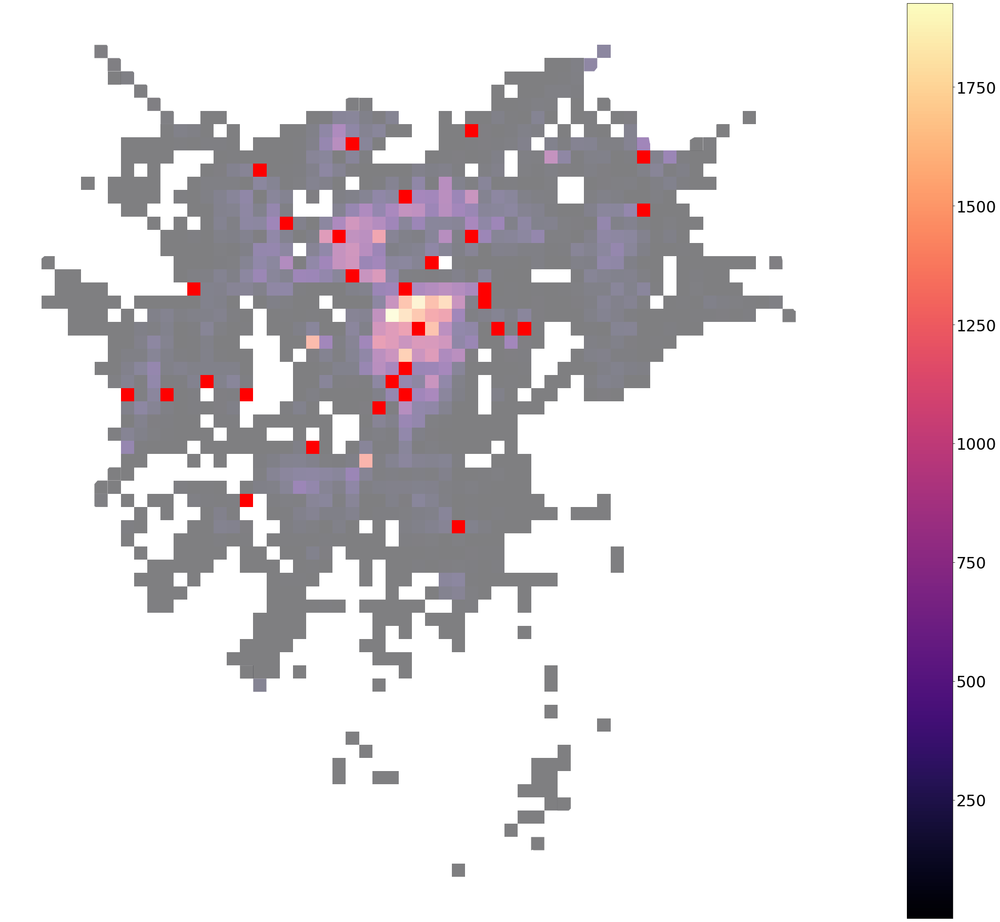

In [53]:
# plot the city

fig, ax = plt.subplots(figsize=(50,32))
polyflows[polyflows.inflow>0].plot(column='inflow',  legend=True, cmap='magma', ax=ax, alpha=0.5)  
polyflows[polyflows.index.isin(potential_stations )].plot(color='red', zorder=3, ax=ax)
ax.axis('off')
plt.show()

In [54]:
STATION_dict = dict(zip(STATION, potential_stations))
STATION_dict 

{'STATION 862': 862,
 'STATION 526': 526,
 'STATION 1431': 1431,
 'STATION 978': 978,
 'STATION 1080': 1080,
 'STATION 505': 505,
 'STATION 624': 624,
 'STATION 1356': 1356,
 'STATION 136': 136,
 'STATION 367': 367,
 'STATION 852': 852,
 'STATION 1324': 1324,
 'STATION 250': 250,
 'STATION 1364': 1364,
 'STATION 1185': 1185,
 'STATION 1082': 1082,
 'STATION 1432': 1432,
 'STATION 1067': 1067,
 'STATION 806': 806,
 'STATION 1133': 1133,
 'STATION 319': 319,
 'STATION 1027': 1027,
 'STATION 1074': 1074,
 'STATION 497': 497,
 'STATION 1622': 1622,
 'STATION 1497': 1497,
 'STATION 732': 732,
 'STATION 2119': 2119,
 'STATION 2123': 2123}

So, **how do we determine the best locations for placing the docking stations**? Well, it obviously depends on the costs.

The first type of cost is that of purchasing and installing the docking stations. To simplify matters, let's assume [Alonso's monocentric city model](https://en.wikipedia.org/wiki/Bid_rent_theory) according to which real estate prices drop according to some exponential or power decay with increasing distance from the central business district (the closer a station to the city center, the more expensive it will be to rent its location.)

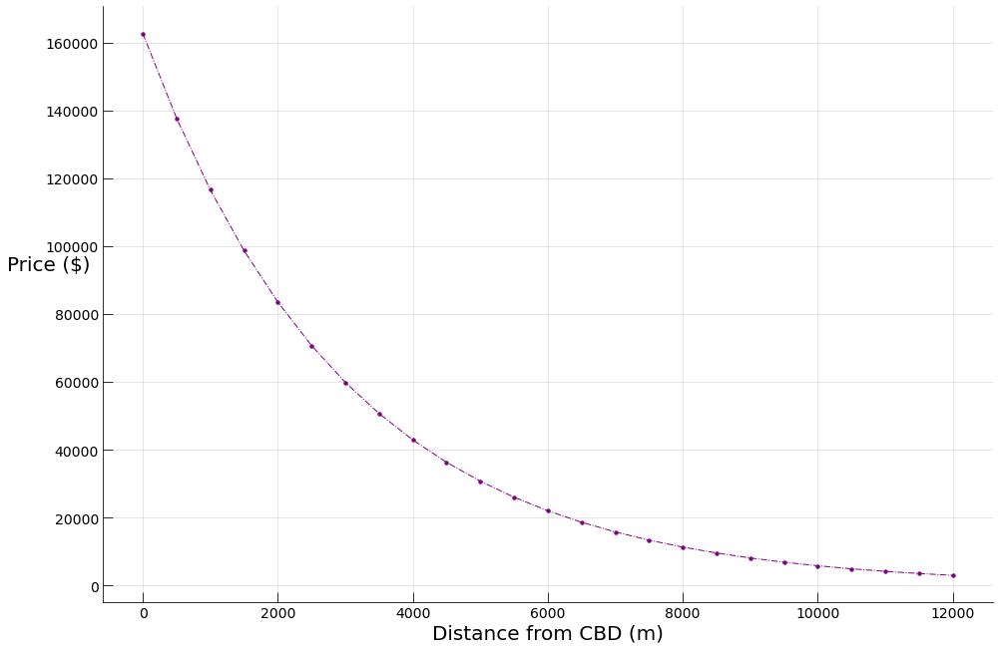

In [55]:
def from_cen(x):
    return np.exp(12-x/3000)
x = np.arange(0,12500,500)
fig, ax = plt.subplots(figsize=(16, 11))
ax.plot(x, from_cen(x), ls='-.', marker='o', markersize=3.4,lw=1, c='purple')
plt.ylabel('Price ($)', size=20, rotation=0)
plt.xlabel('Distance from CBD (m)', size=20)
ax.yaxis.set_label_coords(-0.06,0.55)
ax.tick_params(direction="in", size=10)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
ax.grid(alpha=0.4)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
#plt.savefig('Prices.jpg', dpi=90)
plt.show()

_There is clearly a tradeoff_: while most demand is spatially concentrated in the center (see demand plot), and it would therefore make sense to also install docking stations in central locations to reduce transfer costs, we would, conversely, incur higher costs for choosing central locations (while prices have been chosen with some common sense, they are presented for demonstration purposes only).

Now, let's find out the fixed costs of installing docking stations at the 30 potential locations based on the formula above. But before we can do that, we need to compute a matrix containing the distances between locations in the city.

In [56]:
# get grid cell indices
indlist = np.array(polyflows.index)

# create list of index pairs
pairs = []
for pair in tqdm(combinations(indlist, 2)):
    pairs.append(pair)

# compute distance matrix
mat = np.zeros(shape=(len(indlist), len(indlist)))
for pair in tqdm(pairs):
    mat[pair[0], pair[1]] = polyflows.geometry[pair[0]].centroid.distance(polyflows.geometry[pair[1]].centroid)
    
Euclidean_dist = np.maximum(mat, mat.transpose())
print(Euclidean_dist)

3536470it [00:02, 1493468.02it/s]
100%|███████████████████████████████████████████████████████████████████| 3536470/3536470 [05:12<00:00, 11320.44it/s]


[[   0.          295.44326841  593.6778539  ... 3593.92312345
  3891.08809084 2686.98101891]
 [ 295.44326841    0.          298.24100938 ... 3888.63554089
  4185.91679837 2982.41009386]
 [ 593.6778539   298.24100938    0.         ... 4186.05712589
  4483.44644102 3280.65110324]
 ...
 [3593.92312345 3888.63554089 4186.05712589 ...    0.
   298.08892017  943.32095345]
 [3891.08809084 4185.91679837 4483.44644102 ...  298.08892017
     0.         1229.7239288 ]
 [2686.98101891 2982.41009386 3280.65110324 ...  943.32095345
  1229.7239288     0.        ]]


In [57]:
np.savetxt('../data/Yerevan_300m_eucl.txt', Euclidean_dist)

Let's find which grid cell the Republic Square falls into:

In [58]:
Rep_Square = gpd.sjoin(polyflows, gdf_cen, op='contains')
print(len(Rep_Square))
Rep_Square.tail()

1


,geometry,center_lon,center_lat,area,inflow,index_right
1079,"POLYGON ((458580.076 4447679.594, 458580.076 4...",458430.639912,4.447530e+06,89136.212128,1565,0


Now we can compute the fixed installation costs of setting up a drone station at each of the 30 potential locations:

In [59]:
dists_from_cen = Euclidean_dist[1079] 
costs_from_cen = from_cen(dists_from_cen)

install_cost = {key: costs_from_cen[val] for key, val in STATION_dict.items()}
install_cost 

{'STATION 862': 79431.4768218386,
 'STATION 526': 27682.53843126971,
 'STATION 1431': 74800.72380474549,
 'STATION 978': 104320.16335721091,
 'STATION 1080': 147352.99742989513,
 'STATION 505': 32202.457213997674,
 'STATION 624': 42670.22289944642,
 'STATION 1356': 27947.631654824174,
 'STATION 136': 19667.78719247581,
 'STATION 367': 36042.909995720824,
 'STATION 852': 31578.2271713411,
 'STATION 1324': 42090.60409697009,
 'STATION 250': 26426.690219371783,
 'STATION 1364': 58452.024420578804,
 'STATION 1185': 78916.18998234771,
 'STATION 1082': 120783.98613821992,
 'STATION 1432': 79385.07390430567,
 'STATION 1067': 49366.92588534163,
 'STATION 806': 58452.02442057932,
 'STATION 1133': 130301.98167333883,
 'STATION 319': 30647.466390900914,
 'STATION 1027': 130301.98167330271,
 'STATION 1074': 99005.59582697666,
 'STATION 497': 47470.69392445933,
 'STATION 1622': 64964.7485604175,
 'STATION 1497': 78813.48080048551,
 'STATION 732': 60767.56449868883,
 'STATION 2119': 15799.7361790893

In [60]:
max_capacity = {key: 100000 for key in STATION} #maximum capacity

### Constructing the cost matrix

**The second type of cost** is that of operating the drones which can be safely assumed to be proportional to the distances travelled. However, and here things get interesting, **these distances will depend on the underlying (actually upperlying) urban air traffic path ways!**

In [61]:
pairs_station_costumers = []
for station in tqdm(potential_stations):
    for costumer in COSTUMERS:
        pairs_station_costumers.append((station, costumer))
        
print("Number of station-customer pairs: ", len(pairs_station_costumers))
pairs_station_costumers[:10]

100%|██████████████████████████████████████████████████████████████████████████████| 30/30 [00:00<00:00, 1999.64it/s]

Number of station-customer pairs:  39870


[(862, 0),
 (862, 3),
 (862, 5),
 (862, 6),
 (862, 7),
 (862, 24),
 (862, 25),
 (862, 26),
 (862, 27),
 (862, 28)]

In [62]:
costmat_streets = np.zeros(shape=(len(polyflows), len(polyflows)))
for n, pair in tqdm(enumerate(pairs_station_costumers)):
    orig = polyflows.geometry[pair[0]].centroid
    target = polyflows.geometry[pair[1]].centroid
    
    orig_node = ox.distance.nearest_nodes(G_min, orig.coords[0][0], orig.coords[0][1])
    target_node = ox.distance.nearest_nodes(G_min, target.coords[0][0], target.coords[0][1])
    
    length = nx.shortest_path_length(G_min, orig_node, target_node, weight='length')
    if n % 1000 == 0:
        print(length)
    costmat_streets[pair[0], pair[1]] = length

print(costmat_streets)
streets_costmat_full = np.maximum(costmat_streets, costmat_streets.transpose())

np.savetxt("../data/Yerevan_drone_shortest_paths.csv", streets_costmat_full, fmt="%g", delimiter=",")

1it [00:00,  3.82it/s]

12563.337000000005


1000it [02:46,  4.42it/s]

11492.465

1001it [02:46,  4.53it/s]

2001it [05:19,  6.54it/s]

30075.107000000033


3001it [08:11,  7.68it/s]

10348.664999999999


4001it [10:42,  6.69it/s]

19263.230000000003


5001it [13:16,  7.73it/s]

12298.111999999996


6001it [15:54,  7.94it/s]

5395.681999999999


7001it [18:17,  8.44it/s]

9320.675


8001it [20:58,  4.97it/s]

8931.069999999998


9002it [23:28,  6.20it/s]

26678.94000000001


10001it [26:12,  7.63it/s]

13869.130999999996


11001it [28:34,  7.88it/s]

9507.078000000001


12001it [31:14,  7.62it/s]

16893.502000000008


13000it [33:42,  6.34it/s]

26121.005999999994

13001it [33:43,  6.44it/s]

14001it [36:15,  6.27it/s]

31388.710000000036


15001it [39:01,  6.60it/s]

32326.04


16001it [41:31,  7.85it/s]

4563.293


17001it [44:02,  6.56it/s]

29597.888999999992


18001it [46:45,  8.54it/s]

7292.436999999998


19001it [49:17,  6.15it/s]

16276.155


20001it [51:49,  6.85it/s]

18480.002


21001it [54:25,  5.47it/s]

25074.131999999994


22001it [57:10,  3.37it/s]

25676.037000000008


23001it [59:44,  6.30it/s]

10775.900999999998


24000it [1:02:14,  6.56it/s]

25839.442

24001it [1:02:14,  6.34it/s]

25001it [1:05:05,  7.27it/s]

11061.331999999991


26001it [1:07:52,  7.86it/s]

7710.684000000003


27001it [1:10:18,  7.17it/s]

15160.26100000001


28001it [1:12:59,  7.04it/s]

18164.565


29001it [1:15:28,  6.95it/s]

20600.172000000006


30001it [1:18:04,  8.88it/s]

2941.1330000000007


31001it [1:20:28,  7.58it/s]

16689.084


32001it [1:23:10,  6.18it/s]

35846.21900000004


33000it [1:25:45,  8.09it/s]

26485.44

33002it [1:25:45,  8.01it/s]

34001it [1:28:19,  6.88it/s]

30731.822000000033


35001it [1:30:37,  7.10it/s]

27501.28400000002


36001it [1:33:19,  6.68it/s]

26581.387999999984


37001it [1:35:53,  7.60it/s]

9756.571999999995


38000it [1:38:28,  2.78it/s]

9959.835999999994

38002it [1:38:28,  4.20it/s]

39001it [1:40:50,  7.08it/s]

15470.02000000001


39870it [1:43:10,  6.44it/s]

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [63]:
streets_costmat_full = streets_costmat_full/300
streets_costmat_full.max()

170.17121000000017

In [64]:
streets_costmat_full

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

Now, let's create a dictionary containing the transportation costs given the distance cost matrix (computed as pairwise shortest paths in the underlying air traffic network) from our potential sites to all customers.

In [65]:
transp = {}
for loc in tqdm(potential_stations):
    cost_dict = dict(zip(COSTUMERS, streets_costmat_full[loc][COSTUMERS]))
    transp['STATION {}'.format(loc)] = cost_dict

100%|██████████████████████████████████████████████████████████████████████████████| 30/30 [00:00<00:00, 1666.32it/s]


### Mathematical formulation

In order to see whether this is true, how the solutions compare, and what this means for future urban planners and traffic engineers, we need to solve a linear optimization problem. Consider $n$ customers $i=1,2,...,n$ and $m$ sites for placing the drone docking stations $j=1,2,...,m$. Define continuous variables $x_{ij} \geq 0$ as the amount serviced from drone station $j$ to customer $i$, and binary variables $y_j=1$ if a drone station is installed at location $j$, and $y_j=0$ otherwise. An integer-optimization model for the capacitated facility location problem can now be formulated as follows:


$$
\begin{array}{lll}
\operatorname{minimize} & \sum_{j=1}^{m} f_{j} y_{j}+\sum_{i=1}^{n} \sum_{j=1}^{m} c_{i j} x_{i j} \\
\text { subject to: } & \sum_{j=1}^{m} x_{i j}=d_{i} & \text { for } i=1, \cdots, n \\
& \sum_{i=1}^{n} x_{i j} \leq M_{j} y_{j} & \text { for } j=1, \cdots, m \\
& x_{i j} \leq d_{i} y_{j} & \text { for } i=1, \cdots, n ; j=1, \cdots, m \\
& x_{i j} \geq 0 & \text { for } i=1, \cdots, n ; j=1, \cdots, m \\
& y_{j} \in\{0,1\} & \text { for } j=1, \cdots, m
\end{array}
$$


The objective of the problem is to minimize the sum of drone station installation costs and drone operation costs. The first set of constraints require each customer's demand to be strictly satisfied. The capacity of each drone station $j$ is limited by the second set of constraints: if drone station $j$ is installed, its capacity restriction is taken into account; if it is not installed, the demand satisfied by $j$ is zero. The third set of constraints impose variable upper bounds. Even though they are redundant, they yield a much tighter linear programming relaxation than the equivalent weaker formulation (a very good introduction to linear programming can be found [here](https://www.math.ucla.edu/~tom/LP.pdf)). For an intuition of how such problems are solved, this [Wikipedia article](https://en.wikipedia.org/wiki/Linear_programming) provides a fairly good first overview.
Fortunately, there are many good mathematical optimization solvers out there. Let's see how to code it ourselves:

### A simple toy example

To illustrate the basic concepts of [linear programming](https://en.wikipedia.org/wiki/Linear_programming), let's look at a simple example.

Let's say we want to find the maximum solution to 

$Z = 4x + 3y$

This is the function we are trying to maximize, and is called **objective function**. $x$ and $y$ in this equation are our **decision variables**. Let's say the objective function is subject to the following constraints:

$
\begin{aligned}
&x \geq 0 \\
&y \geq 2 \\
&2 y \leq 25-x \\
&4 y \geq 2 x-8 \\
&y \leq 2 x-5
\end{aligned}
$

It's always a good idea to gain a visual understanding of the problem, so let's build a plot of the problem conditions.

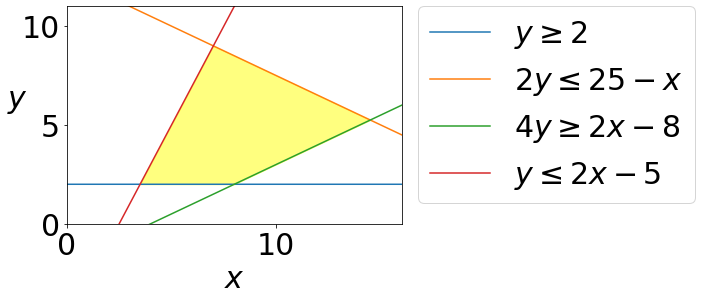

In [66]:
# Construct lines
# x > 0
x = np.linspace(0, 20, 2000)

# y >= 2
y1 = (x*0) + 2

# 2y <= 25 - x
y2 = (25-x)/2.0

# 4y >= 2x - 8 
y3 = (2*x-8)/4.0

# y <= 2x - 5 
y4 = 2 * x -5

# start the plot
plt.plot(x, y1, label=r'$y\geq2$')
plt.plot(x, y2, label=r'$2y\leq25-x$')
plt.plot(x, y3, label=r'$4y\geq 2x - 8$')
plt.plot(x, y4, label=r'$y\leq 2x-5$')
plt.xlim((0, 16))
plt.ylim((0, 11))
plt.xlabel(r'$x$')
plt.ylabel(r'$y$', rotation=0)

# Fill feasible region
y5 = np.minimum(y2, y4)
y6 = np.maximum(y1, y3)
plt.fill_between(x, y5, y6, where=y5>y6, color='yellow', alpha=0.5)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

The solution lies somewhere in the yellow region in the graph above, which is called **feasible region**.

The [fundamental theorem of linear programming](https://en.wikipedia.org/wiki/Fundamental_theorem_of_linear_programming) states that the minima and maxima of linear programming problems lie at the vertices of the feasible region. In this example, there are only 4 corners to our feasible region, so we can find the solutions for each corner and then pick the one that yields the maximum value.

The four corners of a the yellow polygon region lie betweent the following pairs of lines:

$$
\begin{array}{|l|l|}
\hline \text { Line 1 } & \text { Line 2 } \\
\hline y \geq 2 & 4 y \geq 2 x-8 \\
\hline 2 y \leq 25-x & y \leq 2 x-5 \\
\hline 2 y \leq 25-x & 4 y \geq 2 x-8 \\
\hline y \geq 2 & y \leq 2 x-5 \\
\hline
\end{array}
$$

Keeping in mind that the objective function we have to minimise is $Z = 4x + 3y$, we can calculate the value of $Z$ for each corner:

1) 

$\begin{aligned}
&y \geq 2 \text { and } 4 y \geq 2 x-8 \\
&2=(2 x-8) / 4 \\
&x=8 \\
&y=2 \\
&Z=38
\end{aligned}$

2) 

$\begin{aligned}
&2 y \leq 25-x \text { and } y \leq 2 x-5 \\
&(25-x) / 2=(2 x-5) \\
&x=7 \\
&y=9 \\
&Z=55
\end{aligned}
$

3) 

$\begin{aligned}
&2 y \leq 25-x \text { and } 4 y \geq 2 x-8 \\
&(25-x) / 2=(2 x-8) / 4 \\
&x=14.5 \\
&y=5.25 \\
&z=73.75
\end{aligned}$

4) 

$\begin{aligned}
&y \geq 2 \text { and } y \leq 2 x-5 \\
&2=2 x-5 \\
&x=3.5 \\
&y=2 \\
&Z=20
\end{aligned}$


From the manual calculations above we see that the maximum value for $Z$ is $73.75$, when $x$ is $14.5$ and $y$ is $5.25$.

However, it becomes immediately clear that this method of testing every vertex is computationally feasible for only a small number of variables and constraints. As the numbers of constraints and variables increase, it becomes far more difficult to graph these problems and work out all the vertices. Therefore there exist more sophisticated methods for solving this kind of problems. One such popular method is the [simplex algorithm](https://en.wikipedia.org/wiki/Simplex_algorithm).

That said, let's turn to our problem and tackle it with a Python package that has implemented solvers of such [linear programming](https://en.wikipedia.org/wiki/Linear_programming) (LP) problems.

### Linear Programming with PuLP

[PuLP](https://coin-or.github.io/pulp/) is an open-source [linear programming](https://en.wikipedia.org/wiki/Linear_programming) (LP) Python package that offers many industry-standard solvers. We'll begin by importing PuLP.

In [67]:
# import everything from pulp

from pulp import *

Then, we will instantiate a problem class, name it "STATIONLocation" and since we're looking for an optimal minimum, we will use `LpMaximize`.

In [68]:
# SET problem VARIABLE
prob = LpProblem("STATIONLocation", LpMinimize)

We then model our decision variables using the `LpVariable` class.

In [69]:
# DECISION VARIABLES
serv_vars = LpVariable.dicts("Service", 
                            [
                                (i,j) for i in COSTUMERS for j in STATION
                            ], 0)

use_vars = LpVariable.dicts("Uselocation", STATION, 0,1, LpBinary)

The objective function and constraints are added using the `+=` operator to our linear programming model.

The objective function is added first, then the individual constraints.

In [70]:
# OBJECTIVE FUNCTION

prob += lpSum(install_cost[j]*use_vars[j] for j in STATION) + lpSum(transp[j][i]*serv_vars[(i,j)]
                                                               for j in STATION for i in COSTUMERS)

# CONSTRAINTS

for i in COSTUMERS:
    prob += lpSum(serv_vars[(i,j)] for j in STATION) == demand[i] #CONSTRAINT 1

for j in STATION:
    prob += lpSum(serv_vars[(i,j)] for i in COSTUMERS) <= max_capacity[j]*use_vars[j]
    
for i in COSTUMERS:
    for j in STATION:
        prob += serv_vars[(i,j)] <= demand[i]*use_vars[j]

In [71]:
# let's see what our serv_vars variable looks like
list(serv_vars.items())[:10]

[((0, 'STATION 862'), Service_(0,_'STATION_862')),
 ((0, 'STATION 526'), Service_(0,_'STATION_526')),
 ((0, 'STATION 1431'), Service_(0,_'STATION_1431')),
 ((0, 'STATION 978'), Service_(0,_'STATION_978')),
 ((0, 'STATION 1080'), Service_(0,_'STATION_1080')),
 ((0, 'STATION 505'), Service_(0,_'STATION_505')),
 ((0, 'STATION 624'), Service_(0,_'STATION_624')),
 ((0, 'STATION 1356'), Service_(0,_'STATION_1356')),
 ((0, 'STATION 136'), Service_(0,_'STATION_136')),
 ((0, 'STATION 367'), Service_(0,_'STATION_367'))]

In [72]:
# let's see what our use_vars variable looks like
list(use_vars.items())[:10]

[('STATION 862', Uselocation_STATION_862),
 ('STATION 526', Uselocation_STATION_526),
 ('STATION 1431', Uselocation_STATION_1431),
 ('STATION 978', Uselocation_STATION_978),
 ('STATION 1080', Uselocation_STATION_1080),
 ('STATION 505', Uselocation_STATION_505),
 ('STATION 624', Uselocation_STATION_624),
 ('STATION 1356', Uselocation_STATION_1356),
 ('STATION 136', Uselocation_STATION_136),
 ('STATION 367', Uselocation_STATION_367)]

In [73]:
# SOLUTION

prob.solve()
print("Status: ", LpStatus[prob.status])

# PRINT DECISION VARIABLES
TOL = .0001
for i in STATION:
    if use_vars[i].varValue > TOL:
        print("Establish facility at site ", i)
        
for v in prob.variables():
    if v.varValue > 0:
        print(v.name, " = ", v.varValue)

# PRINT OPTIMAL SOLUTION
print("The cost of production in dollars for one year = ", value(prob.objective))

Status:  Optimal
Establish facility at site  STATION 862
Establish facility at site  STATION 505
Establish facility at site  STATION 624
Establish facility at site  STATION 136
Establish facility at site  STATION 1324
Establish facility at site  STATION 1364
Establish facility at site  STATION 1067
Establish facility at site  STATION 1133
Establish facility at site  STATION 2119
Establish facility at site  STATION 2123
Service_(0,_'STATION_136')  =  1.0
Service_(100,_'STATION_136')  =  8.0
Service_(1006,_'STATION_1324')  =  1.0
Service_(1007,_'STATION_624')  =  145.0
Service_(1008,_'STATION_624')  =  12.0
Service_(101,_'STATION_136')  =  1.0
Service_(1011,_'STATION_1067')  =  2.0
Service_(1012,_'STATION_1067')  =  140.0
Service_(1013,_'STATION_1067')  =  234.0
Service_(1014,_'STATION_1067')  =  518.0
Service_(1015,_'STATION_1067')  =  420.0
Service_(1016,_'STATION_1067')  =  161.0
Service_(1017,_'STATION_862')  =  68.0
Service_(1018,_'STATION_1133')  =  205.0
Service_(1019,_'STATION_11

Service_(1297,_'STATION_1067')  =  31.0
Service_(1298,_'STATION_1067')  =  104.0
Service_(1299,_'STATION_1067')  =  390.0
Service_(130,_'STATION_136')  =  2.0
Service_(1300,_'STATION_1067')  =  450.0
Service_(1301,_'STATION_1364')  =  180.0
Service_(1302,_'STATION_1364')  =  71.0
Service_(1303,_'STATION_1364')  =  63.0
Service_(1304,_'STATION_1364')  =  42.0
Service_(1305,_'STATION_1133')  =  96.0
Service_(1306,_'STATION_1133')  =  609.0
Service_(1307,_'STATION_1133')  =  812.0
Service_(1308,_'STATION_1133')  =  436.0
Service_(1309,_'STATION_1133')  =  296.0
Service_(131,_'STATION_136')  =  9.0
Service_(1310,_'STATION_1133')  =  278.0
Service_(1311,_'STATION_1133')  =  668.0
Service_(1312,_'STATION_1133')  =  188.0
Service_(1313,_'STATION_1133')  =  70.0
Service_(1314,_'STATION_1133')  =  67.0
Service_(1315,_'STATION_1133')  =  4.0
Service_(1316,_'STATION_1133')  =  4.0
Service_(1317,_'STATION_1133')  =  15.0
Service_(1318,_'STATION_1133')  =  12.0
Service_(1319,_'STATION_1324')  =  29

Service_(1675,_'STATION_1364')  =  111.0
Service_(1676,_'STATION_1364')  =  100.0
Service_(1677,_'STATION_1364')  =  313.0
Service_(1678,_'STATION_1364')  =  60.0
Service_(1679,_'STATION_1133')  =  55.0
Service_(1681,_'STATION_2123')  =  20.0
Service_(1682,_'STATION_2123')  =  34.0
Service_(1683,_'STATION_2123')  =  35.0
Service_(1684,_'STATION_2123')  =  20.0
Service_(1685,_'STATION_2123')  =  10.0
Service_(1689,_'STATION_1133')  =  3.0
Service_(169,_'STATION_136')  =  63.0
Service_(1690,_'STATION_1133')  =  2.0
Service_(1697,_'STATION_1324')  =  2.0
Service_(1698,_'STATION_1324')  =  4.0
Service_(170,_'STATION_136')  =  87.0
Service_(1703,_'STATION_1324')  =  1.0
Service_(171,_'STATION_136')  =  56.0
Service_(1717,_'STATION_1324')  =  1.0
Service_(1718,_'STATION_1324')  =  4.0
Service_(1719,_'STATION_1324')  =  5.0
Service_(172,_'STATION_136')  =  197.0
Service_(1721,_'STATION_1324')  =  3.0
Service_(1723,_'STATION_1324')  =  2.0
Service_(1726,_'STATION_1067')  =  2.0
Service_(1727,_

Service_(401,_'STATION_136')  =  129.0
Service_(402,_'STATION_136')  =  95.0
Service_(403,_'STATION_136')  =  79.0
Service_(404,_'STATION_136')  =  113.0
Service_(405,_'STATION_136')  =  48.0
Service_(406,_'STATION_505')  =  12.0
Service_(407,_'STATION_505')  =  19.0
Service_(408,_'STATION_505')  =  81.0
Service_(409,_'STATION_505')  =  104.0
Service_(410,_'STATION_505')  =  37.0
Service_(411,_'STATION_505')  =  38.0
Service_(412,_'STATION_505')  =  18.0
Service_(414,_'STATION_136')  =  15.0
Service_(415,_'STATION_505')  =  11.0
Service_(417,_'STATION_505')  =  6.0
Service_(418,_'STATION_505')  =  20.0
Service_(419,_'STATION_505')  =  98.0
Service_(420,_'STATION_505')  =  128.0
Service_(421,_'STATION_505')  =  30.0
Service_(422,_'STATION_505')  =  14.0
Service_(433,_'STATION_624')  =  1.0
Service_(434,_'STATION_624')  =  2.0
Service_(435,_'STATION_624')  =  20.0
Service_(436,_'STATION_624')  =  118.0
Service_(437,_'STATION_624')  =  48.0
Service_(438,_'STATION_624')  =  184.0
Service_(

Service_(710,_'STATION_624')  =  177.0
Service_(711,_'STATION_624')  =  97.0
Service_(712,_'STATION_624')  =  127.0
Service_(713,_'STATION_624')  =  32.0
Service_(715,_'STATION_862')  =  4.0
Service_(716,_'STATION_862')  =  66.0
Service_(717,_'STATION_862')  =  160.0
Service_(718,_'STATION_862')  =  284.0
Service_(719,_'STATION_862')  =  392.0
Service_(72,_'STATION_136')  =  3.0
Service_(720,_'STATION_862')  =  2.0
Service_(721,_'STATION_862')  =  14.0
Service_(722,_'STATION_1133')  =  20.0
Service_(723,_'STATION_1133')  =  197.0
Service_(724,_'STATION_1133')  =  1395.0
Service_(725,_'STATION_1133')  =  35.0
Service_(726,_'STATION_1133')  =  11.0
Service_(727,_'STATION_1133')  =  12.0
Service_(728,_'STATION_1133')  =  60.0
Service_(729,_'STATION_1133')  =  2.0
Service_(73,_'STATION_136')  =  2.0
Service_(730,_'STATION_505')  =  7.0
Service_(732,_'STATION_505')  =  24.0
Service_(733,_'STATION_505')  =  92.0
Service_(734,_'STATION_505')  =  253.0
Service_(735,_'STATION_505')  =  306.0
Se

Uselocation_STATION_862  =  1.0
The cost of production in dollars for one year =  1753441.7879880148


In [74]:
prob.variables()[-30:][3].name

'Uselocation_STATION_1074'

In [75]:
loc_list = [int(s) for s in prob.variables()[-30:][3].name if s.isdigit()]
loc_list

[1, 0, 7, 4]

In [76]:
int(''.join(str(i) for i in loc_list))

1074

In [77]:
def magic(number):
    return int(''.join(str(i) for i in number))

chosen_stations = []
for v in prob.variables()[-30:]:
    if v.varValue>0:
        print(v.name, " = ", v.varValue)
        loc_list = [int(s) for s in v.name if s.isdigit()]
        loc_num = magic(loc_list)
        print(loc_num)
        chosen_stations.append(loc_num)
chosen_stations

Uselocation_STATION_1067  =  1.0
1067
Uselocation_STATION_1133  =  1.0
1133
Uselocation_STATION_1324  =  1.0
1324
Uselocation_STATION_136  =  1.0
136
Uselocation_STATION_1364  =  1.0
1364
Uselocation_STATION_2119  =  1.0
2119
Uselocation_STATION_2123  =  1.0
2123
Uselocation_STATION_505  =  1.0
505
Uselocation_STATION_624  =  1.0
624
Uselocation_STATION_862  =  1.0
862


[1067, 1133, 1324, 136, 1364, 2119, 2123, 505, 624, 862]

Now, let's build a GeoDataFrame containing `Point` geometries of the selected optimal locations for placing the drone docking stations in Yerevan city so we can make a visually meaningflu and pleasing schematic map of the selected sites and their service (catchment) areas. But before we do that, we need to build a GeoDataFrame containing the centroid `Point` geometries of the grid cell polygons.

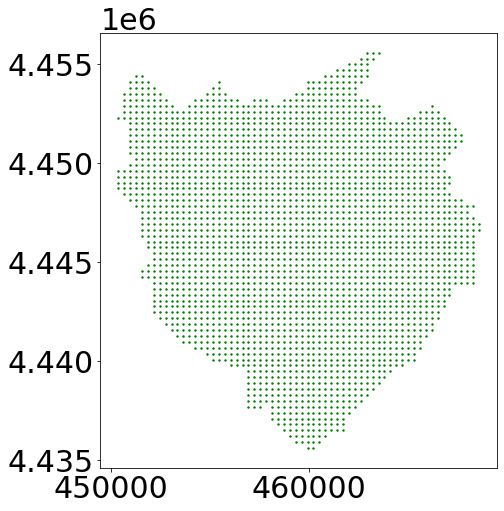

In [78]:
centroids = polyframe[['center_lon', 'center_lat']]
geometry = [Point(xy) for xy in zip(polyframe.center_lon, polyframe.center_lat)]
centroids = centroids.drop(['center_lon', 'center_lat'], axis=1)
crs = polyframe.geometry.crs
centroids = gpd.GeoDataFrame(centroids, crs=crs, geometry=geometry)

fig, ax = plt.subplots(figsize=(12,8))
centroids.plot(ax=ax,color='green', markersize=2)
plt.show()

In [79]:
sol_matrix_stations = np.zeros(shape=(len(polyflows), len(polyflows)))

for var in tqdm(prob.variables()):
    if var.varValue > 0:
        try: 
            # get station index
            station_num = int(re.search(r'\d+', var.name.split('_')[3]).group())
            # get customer index
            costumer_num = int(re.search(r'\d+', var.name.split('_')[1]).group())
            
#             print("Station number: ", station_num)
#             print("Customer number: ", costumer_num)
#             print('\n')
            
            sol_matrix_stations[station_num, costumer_num] = var.varValue
        except:
            pass


coverage_stations = np.zeros(len(polyframe))
for n, ind in enumerate(chosen_stations):
    inds_ = np.where(sol_matrix_stations[ind]>0)[0]
    coverage_stations[inds_] = n + 1
    print(coverage_stations[ind])
    
print(coverage_stations)

coverage_stations = coverage_stations.astype(int)
polyflows['coverage_stations'] = coverage_stations

centroids_chosen_stations = centroids.loc[centroids.index.isin(chosen_stations)]
chosen_ind_stations_color_dict = {}
for n, ind in enumerate(chosen_stations):
    chosen_ind_stations_color_dict[ind] = n + 1
centroids_chosen_stations['color'] = 0
centroids_chosen_stations['color'].update(pd.Series(chosen_ind_stations_color_dict))
centroids_chosen_stations

100%|██████████████████████████████████████████████████████████████████████| 38570/38570 [00:00<00:00, 857100.58it/s]

1.0
2.0
3.0
4.0
5.0
6.0
7.0
8.0
9.0
10.0
[4. 0. 0. ... 0. 0. 0.]



C:\Users\gevor\anaconda3\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)
C:\Users\gevor\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3418: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exec(code_obj, self.user_global_ns, self.user_ns)


,geometry,color
136,POINT (452154.305 4446635.750),4
505,POINT (454844.163 4444249.822),8
624,POINT (455740.782 4450512.883),9
862,POINT (457235.148 4449319.919),10
1067,POINT (458430.640 4451109.365),1
1133,POINT (458729.513 4448126.955),2
1324,POINT (459626.132 4443653.340),3
1364,POINT (459925.005 4450214.642),5
2119,POINT (463810.356 4452004.088),6
2123,POINT (463810.356 4450811.124),7


Now, let's find out the total supply each chosen docking station will provide for.

In [80]:
sol_supply_dict_stations = {}

for n, ind in enumerate(chosen_stations):
    supply = sol_matrix_stations[ind].sum()
    sol_supply_dict_stations[ind] = supply
    print(supply)

print("\n")
print("Total supply: ", sum(sol_supply_dict_stations.values()))
print("Total demand: ", sum(demand))

centroids_chosen_stations.loc[:, 'supply'] = 0
centroids_chosen_stations['supply'].update(pd.Series(sol_supply_dict_stations))
centroids_chosen_stations

14063.0
60519.0
5302.0
6368.0
6055.0
4350.0
10891.0
10084.0
12436.0
21022.0


Total supply:  151090.0
Total demand:  151090


C:\Users\gevor\anaconda3\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)
C:\Users\gevor\anaconda3\lib\site-packages\pandas\core\indexing.py:1765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  isetter(loc, value)
C:\Users\gevor\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3418: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docum

,geometry,color,supply
136,POINT (452154.305 4446635.750),4,6368
505,POINT (454844.163 4444249.822),8,10084
624,POINT (455740.782 4450512.883),9,12436
862,POINT (457235.148 4449319.919),10,21022
1067,POINT (458430.640 4451109.365),1,14063
1133,POINT (458729.513 4448126.955),2,60519
1324,POINT (459626.132 4443653.340),3,5302
1364,POINT (459925.005 4450214.642),5,6055
2119,POINT (463810.356 4452004.088),6,4350
2123,POINT (463810.356 4450811.124),7,10891


Let's finally plot the results!

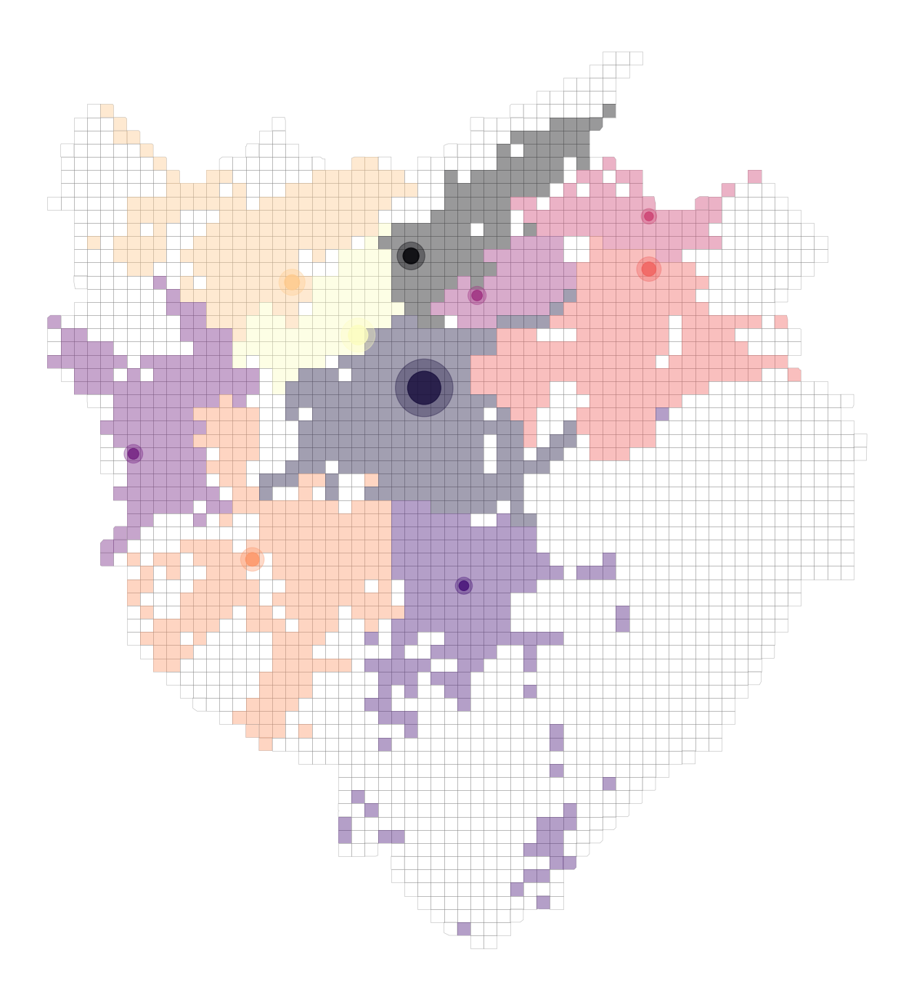

In [81]:
# plot the city
# west, south, east, north = city.unary_union.bounds
fig, ax = plt.subplots(figsize=(16,16), dpi=90)


polyflows[polyflows.inflow>0].plot(column='coverage_stations', cmap='magma', zorder=3, ax=ax, alpha=0.4)
polyflows.plot(ax=ax, facecolor="none", edgecolor='gray',alpha=0.5, zorder=2, linewidth=0.5)
centroids_chosen_stations.plot(markersize=centroids_chosen_stations['supply']/15, \
                               ax=ax, column='color', cmap='magma', alpha=0.35, zorder=4)
centroids_chosen_stations.plot(markersize=centroids_chosen_stations['supply']/45, \
                               ax=ax, column='color', cmap='magma', alpha=0.8, zorder=5)

ax.axis('off')
plt.tight_layout()

#fig.savefig('Solution_stations.jpg', dpi=fig.dpi)
plt.show()

We have successfully identified the locations best suitable for placing drone docking stations!

### Homework assignment

Solve the optimal drone docking station problem for Rome.

Complete the homework assignment in a clean Jupyter Notebook, name the notebook **< Name > < Surname > Class 12 Homework** and upload it to Moodle.